# Automatic trees extraction Using Satellite RGB and LiDAR Elevation

In this notebook, we will show how to utilize both SpaceNet satellite image and USGS 3DEP LiDAR data (elevation attribute) to automatically extract tree footprints.

## Setup

Before proceeding, make sure this notebook connects with the proper kernel (`conda_[name]`, `[name]` is name of the new Conda environment you just created).

In [1]:
import os, time, json, random
from pathlib import Path
from tqdm import tqdm
from p_tqdm import p_umap
import numpy as np
import pandas as pd
import skimage
import torch
from torch import nn
import io
import pickle
import math

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

### External modules

We made some customized modification to the external module `solaris` and `deepforest` in `libs/` directory. Please refer to their [GitHub page solaris](https://github.com/CosmiQ/solaris) and [GitHub page deepforest](https://github.com/weecology/DeepForest) for more information.

In [2]:
import libs.deepforest as deepforest
import libs.solaris as sol

2022-06-13 03:24:20.378604: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib:/usr/local/cuda/lib64:/usr/local/cuda/extras/CUPTI/lib64:/opt/amazon/efa/lib64:/opt/amazon/openmpi/lib64:/usr/local/lib:/usr/lib:/lib:/usr/local/cuda/lib:/usr/local/cuda/lib64:/usr/local/cuda/extras/CUPTI/lib64:/opt/amazon/efa/lib64:/opt/amazon/openmpi/lib64:/usr/local/lib:/usr/lib:/lib:
2022-06-13 03:24:20.378648: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
from libs.deepforest import main
from libs.deepforest import get_data
from libs.deepforest import utilities
from libs.deepforest import preprocess
from libs.deepforest import visualize

# Bringing NEON.pt file to the deepforest local directory. 
!sudo wget -O ./libs/deepforest/data/NEON.pt https://d2974anqgfynow.cloudfront.net/NEON.pt

### Plotting preferences

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.path import Path
plt.style.use('seaborn-notebook')

## Data

The datasets used in this notebook are saved in directory `./data/trees/`.

1. **SpaceNet satellite images**:
There are 3850 tiles ("chips") of 200m$\times$200m satellite images/labels in this training dataset (`SN2/AOI_2_Vegas`). See [link](https://spacenet.ai/las-vegas/) for more information. We extract the ~0.3m resolution pan-sharpened RGB (`PS-RGB`) 3-channel satellite images and perform white balancing. On the other hand, the `geojson_buildings/` directory contains GeoJSON files for building ground truths.

2. **USGS 3DEP LiDAR**:
This is [a large USGS project](https://www.usgs.gov/core-science-systems/ngp/3dep) that covers many regions throughout US. Also see [here](https://usgs.entwine.io/) for cool visualizations. We extract 3D point clouds in Las Vegas region that overlap with the SpaceNet data, project them into corresponding 2D tiles. The LiDAR data have two attributes: elevation and reflection intensity. For building extraction, we will use the elevation attribute after normalizing the elevation values.

At the end, we merge the LiDAR elevation attribute as an additional channel to the RGB image, and save these 4-channel images to `RGB+ELEV/` directory.

In [5]:
# Paths 
data_dir = './data/trees/'
img_dir = os.path.join(data_dir, 'RGB+ELEV')
mask_dir = os.path.join(data_dir, 'masks_trees')

# Prefix of all filename - naming convention
prefix = 'SN2_buildings_train_AOI_2_Vegas_'

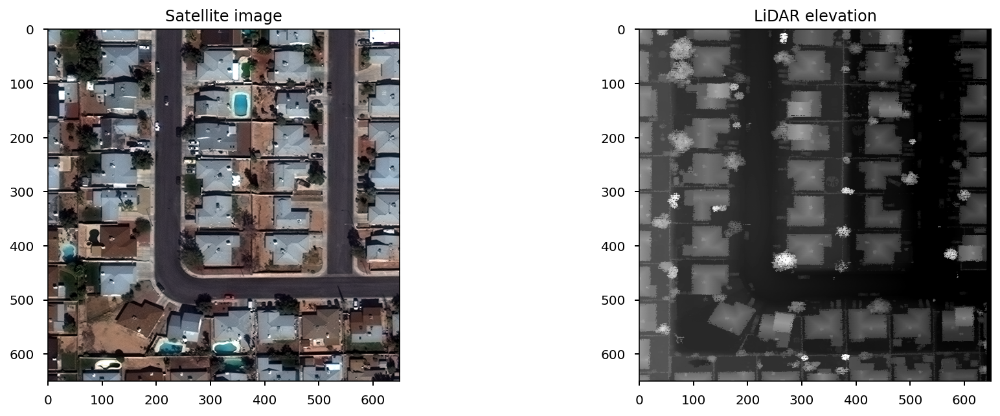

In [6]:
# Show a sample data
sample = 'img1443' # chip ID, img? format Change to 'img1423'

# Read in 4-channel image from GeoTIFF.
img_file = prefix + 'RGB+ELEV_' + sample + '.tif'
img_path = os.path.join(img_dir, img_file)
img = skimage.io.imread(img_path)
rgb = img[..., :3]
elev = img[..., -1]

# Display satellite image and LiDAR eleveation attribute.
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(rgb)
ax[0].set_title('Satellite image')
ax[1].imshow(elev, cmap='gray', vmin=0, vmax=5000)
ax[1].set_title('LiDAR elevation')
fig.show()

## Transfer learning 

We first use the Satellite images with the deepforest pre-trained network for transfer learning. 

The deepforest network is built using semi-supervised learning. For more details refer to deepforest documentation [link](https://deepforest.readthedocs.io/en/latest/landing.html)


<img src="semi-supervised.png" width= "1000" title="Semi-supervised learning in DeepForest"/>


1. Load the weights from the deepforest latest network
2. Check predictions on one of the Satellite image 
3. Annotate bounding box on 10 images 
4. Retrain deepforest network for 10 iterations 
5. Check prediction on images used for training as well as test images 
6. Predict bounding boxes for trees for all images in the data folder

### Step 1: Load the weights from the deepforest latest network

In [7]:
# Using the sample image and the weights from the pretrained network
model = main.deepforest(config_file='./libs/deepforest/data/deepforest_config.yml')
model.use_release()


Reading config file: ./libs/deepforest/data/deepforest_config.yml


Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth


  0%|          | 0.00/130M [00:00<?, ?B/s]

Model from DeepForest release https://github.com/weecology/DeepForest/releases/tag/1.0.0 was already downloaded. Loading model from file.
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/1.0.0


### Step 2: Check predictions on one of the Satellite image 

/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
100%|██████████| 9/9 [00:00<00:00, 25.23it/s]

270 predictions in overlapping windows, applying non-max supression
170 predictions kept after non-max suppression


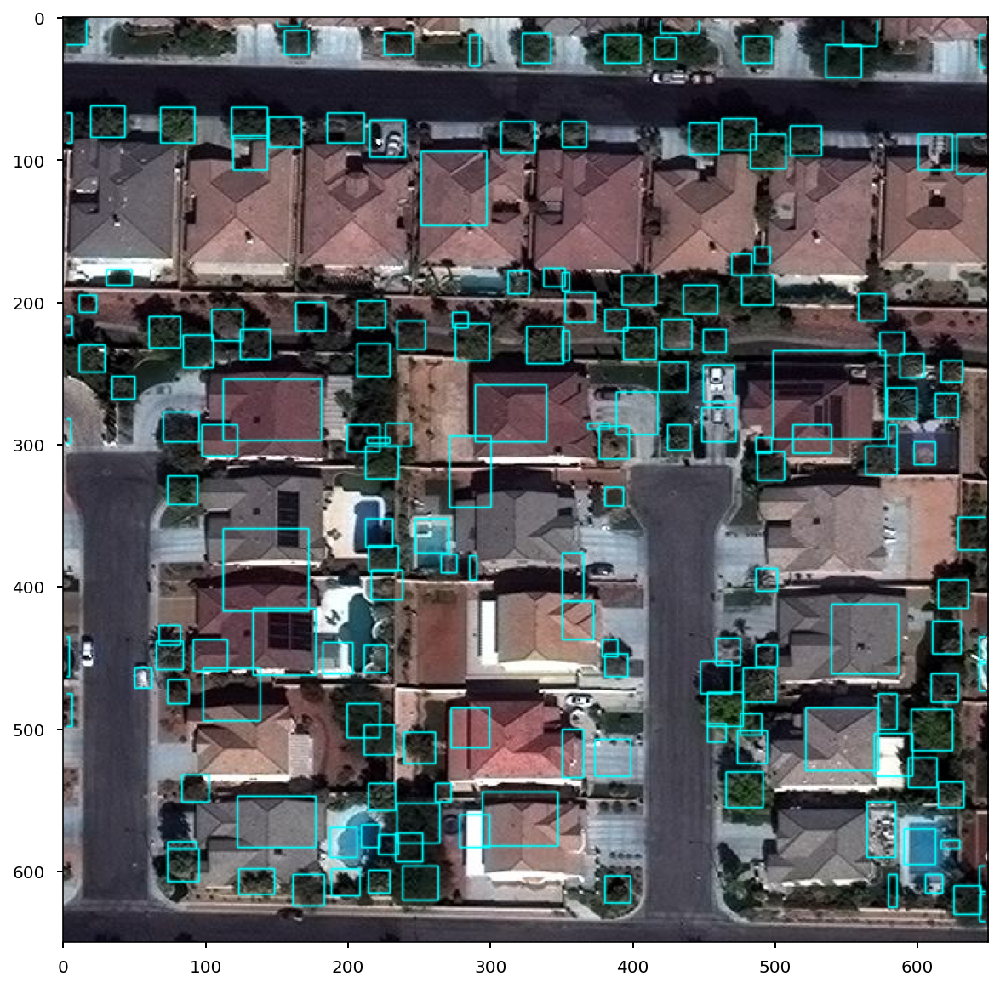

In [8]:
plt.rcParams['figure.figsize'] = [10, 10]
sample_image1 = './data/color_img.jpg'
predicted_raster = model.predict_tile(sample_image1, return_plot = True, patch_size=300,patch_overlap=0.05)
plt.imshow(predicted_raster[:,:,::-1])

As you can see visually, there are lots of false positives in the output. Some of the roofs, solar panels and swimming pool areas are also predicted as trees. Let us try to improve the prediction, by annotating few images from our data with bounding boxes and use it to retrain the pre-built network for a few epochs. This technique is also called few-shot learning [link](https://arxiv.org/abs/1904.05046). 

### Step3: Annotate bounding box on 10 images from our data (Example image where manual annotations are done)

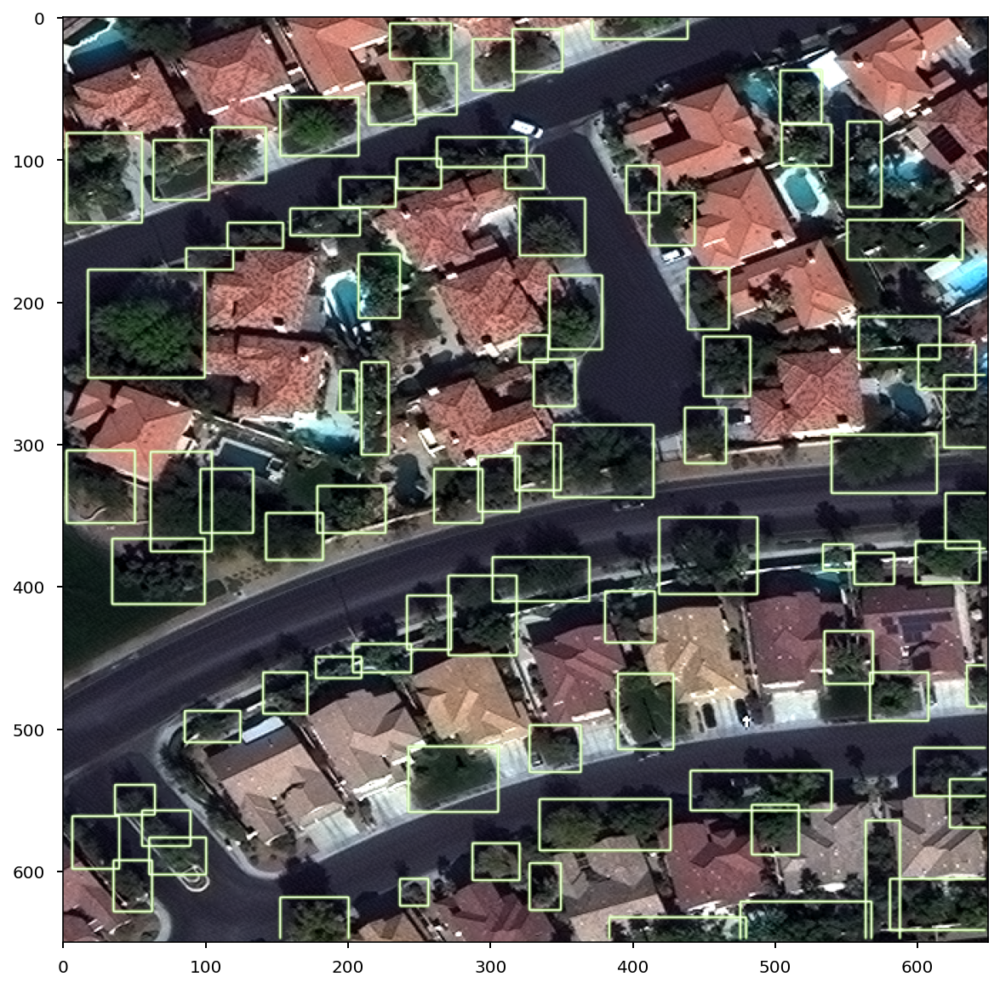

In [81]:
# Sample annotated image with bounding boxes
deep_forest_extras_dir = './deep_forest_extras/'
annotations_file = "annotations_new_images.csv"
df_new_annotations = pd.read_csv(deep_forest_extras_dir + annotations_file)
image_annotated = 'SN2_buildings_train_AOI_2_Vegas_RGB_img1009.png'
image_read = skimage.io.imread(deep_forest_extras_dir+image_annotated)
df_image = df_new_annotations[df_new_annotations['image_path']==image_annotated]
plt.imshow(visualize.plot_predictions(image_read, df_image, color=(127,255,0), thickness=1))

### Step4: Retrain deepforest network for 10 iterations with annotated images 

In [87]:
# Training deepforest with new data
annotations_file_train = "./deep_forest_extras/annotations_new_images.csv"
# Model configuration
model.config["train"]["epochs"] = 10
model.config["gpus"] = 1
model.config["workers"] = 10

model.config["train"]["csv_file"] = annotations_file_train
model.config["train"]["root_dir"] = os.path.dirname(annotations_file_train)
model.config["train"]["fast_dev_run"] = False

model.create_trainer()
model.use_release()


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Model from DeepForest release https://github.com/weecology/DeepForest/releases/tag/1.0.0 was already downloaded. Loading model from file.
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/1.0.0


In [88]:
# Starting the training. This might take a few minutes to finish based on the instance type selected
start_time = time.time()
model.trainer.fit(model)
print(f"--- Training: {(time.time() - start_time):.2f} seconds ---")

/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/pytorch_lightning/trainer/configuration_validator.py:307: LightningDeprecationWarning: The `LightningModule.on_epoch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_end` instead.
  rank_zero_deprecation(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name  | Type      | Params
------------------------------------
0 | model | RetinaNet | 32.1 M
------------------------------------
31.9 M    Trainable params
222 K     Non-trainable params
32.1 M    Total params
128.592   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:378: UserWarning: One of given dataloaders is None and it will be skipped.
  rank_zero_warn("One of given dataloaders is None and it will be skipped.")


Training: 0it [00:00, ?it/s]

--- Training: 14.13 seconds ---


### Step5: Check prediction on images used for training as well as test images 

/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 26.51it/s]


141 predictions in overlapping windows, applying non-max supression
114 predictions kept after non-max suppression


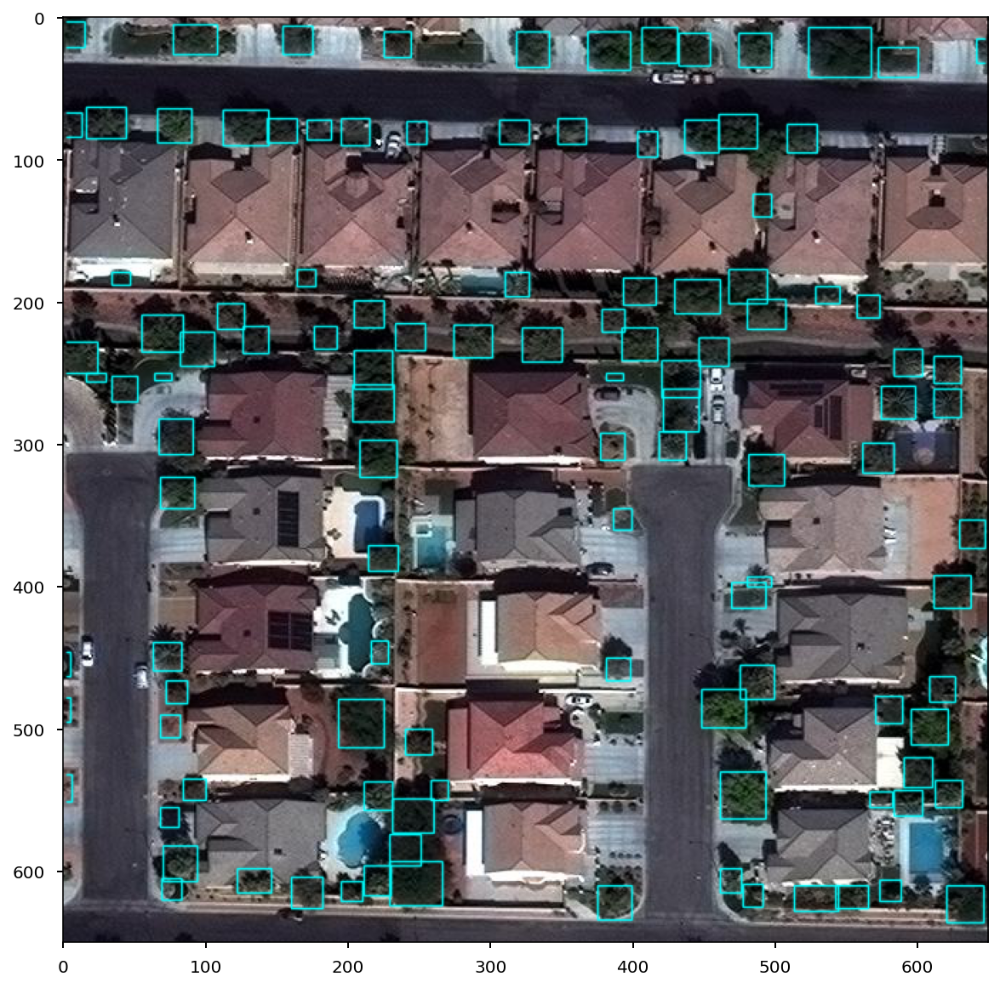

In [21]:
# Using the retrained model to make predictions 
sample_image1 = './data/color_img.jpg'
predicted_raster = model.predict_tile(sample_image1, return_plot = True, patch_size=400,patch_overlap=0.05)
plt.imshow(predicted_raster[:,:,::-1])

### Step6: Predict bounding boxes for trees for all images in the data folder [Optional]

In [51]:
# Code to generate the rgb images and predict bounding boxes for trees
rgb_deepforest_dir = os.path.join(data_dir, 'rgb_buildings_deepforest')

if not os.path.exists(rgb_deepforest_dir):
    os.mkdir(rgb_deepforest_dir)

    img_file_list = [f for f in os.listdir(img_dir) if f.endswith('.tif')]
    for img_file in tqdm(img_file_list):
        # Get the `img[number]` chip ID from file name.
        chip_id = os.path.splitext(img_file)[0].split('_')[-1]
        img_path = os.path.join(img_dir, img_file)
        img = skimage.io.imread(img_path)
        rgb = img[..., :3]/255.0
        rgb_file = prefix + 'RGB_' + chip_id + '.jpg'
        rgb_file_csv = prefix + 'RGB_' + chip_id + '.csv'
        rgb_path = os.path.join(rgb_deepforest_dir, rgb_file)
        rgb_file_csv_path = os.path.join(rgb_deepforest_dir, rgb_file_csv)
        plt.imsave(rgb_path, rgb)
        model.predict_tile(rgb_path, return_plot = False, patch_size=400,patch_overlap=0.05).to_csv(rgb_file_csv_path)

  0%|          | 0/256 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

  0%|          | 1/256 [00:00<00:54,  4.69it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


169 predictions in overlapping windows, applying non-max supression
112 predictions kept after non-max suppression



  1%|          | 2/256 [00:00<00:52,  4.80it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


190 predictions in overlapping windows, applying non-max supression
125 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.47it/s]


191 predictions in overlapping windows, applying non-max supression


  1%|          | 3/256 [00:00<00:51,  4.87it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


134 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.29it/s]

209 predictions in overlapping windows, applying non-max supression



  2%|▏         | 4/256 [00:00<00:51,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


138 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.20it/s]

171 predictions in overlapping windows, applying non-max supression



  2%|▏         | 5/256 [00:01<00:51,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


111 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.50it/s]


158 predictions in overlapping windows, applying non-max supression


  2%|▏         | 6/256 [00:01<00:50,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


114 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.21it/s]

169 predictions in overlapping windows, applying non-max supression



  3%|▎         | 7/256 [00:01<00:50,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.29it/s]

174 predictions in overlapping windows, applying non-max supression



  3%|▎         | 8/256 [00:01<00:50,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


117 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.57it/s]


183 predictions in overlapping windows, applying non-max supression
123 predictions kept after non-max suppression


  4%|▎         | 9/256 [00:01<00:50,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

177 predictions in overlapping windows, applying non-max supression



  4%|▍         | 10/256 [00:02<00:49,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


113 predictions kept after non-max suppression



  4%|▍         | 11/256 [00:02<00:49,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


187 predictions in overlapping windows, applying non-max supression
120 predictions kept after non-max suppression



  5%|▍         | 12/256 [00:02<00:49,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


165 predictions in overlapping windows, applying non-max supression
118 predictions kept after non-max suppression



  5%|▌         | 13/256 [00:02<00:49,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


136 predictions in overlapping windows, applying non-max supression
93 predictions kept after non-max suppression



  5%|▌         | 14/256 [00:02<00:49,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


161 predictions in overlapping windows, applying non-max supression
112 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.52it/s]


134 predictions in overlapping windows, applying non-max supression


  6%|▌         | 15/256 [00:03<00:48,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


88 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

167 predictions in overlapping windows, applying non-max supression



  6%|▋         | 16/256 [00:03<00:48,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


116 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.25it/s]

172 predictions in overlapping windows, applying non-max supression



  7%|▋         | 17/256 [00:03<00:48,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


111 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.42it/s]


139 predictions in overlapping windows, applying non-max supression


  7%|▋         | 18/256 [00:03<00:48,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


93 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.31it/s]


135 predictions in overlapping windows, applying non-max supression
91 predictions kept after non-max suppression


  7%|▋         | 19/256 [00:03<00:47,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.57it/s]


168 predictions in overlapping windows, applying non-max supression
108 predictions kept after non-max suppression


  8%|▊         | 20/256 [00:04<00:47,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.60it/s]


170 predictions in overlapping windows, applying non-max supression
105 predictions kept after non-max suppression


  8%|▊         | 21/256 [00:04<00:47,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.32it/s]


147 predictions in overlapping windows, applying non-max supression


  9%|▊         | 22/256 [00:04<00:47,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


88 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.51it/s]


149 predictions in overlapping windows, applying non-max supression
105 predictions kept after non-max suppression


  9%|▉         | 23/256 [00:04<00:46,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.25it/s]

147 predictions in overlapping windows, applying non-max supression



  9%|▉         | 24/256 [00:04<00:46,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.48it/s]


160 predictions in overlapping windows, applying non-max supression


 10%|▉         | 25/256 [00:05<00:46,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


100 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.54it/s]


150 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression


 10%|█         | 26/256 [00:05<00:46,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.15it/s]

136 predictions in overlapping windows, applying non-max supression



 11%|█         | 27/256 [00:05<00:46,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


97 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 26.93it/s]

163 predictions in overlapping windows, applying non-max supression



 11%|█         | 28/256 [00:05<00:46,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.19it/s]

170 predictions in overlapping windows, applying non-max supression



 11%|█▏        | 29/256 [00:05<00:46,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


113 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.33it/s]


168 predictions in overlapping windows, applying non-max supression
119 predictions kept after non-max suppression


 12%|█▏        | 30/256 [00:06<00:45,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 12%|█▏        | 31/256 [00:06<00:44,  5.01it/s]

65 predictions in overlapping windows, applying non-max supression
45 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.38it/s]


170 predictions in overlapping windows, applying non-max supression


 12%|█▎        | 32/256 [00:06<00:44,  4.99it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


112 predictions kept after non-max suppression



 13%|█▎        | 33/256 [00:06<00:43,  5.16it/s]

21 predictions in overlapping windows, applying non-max supression
19 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.39it/s]


186 predictions in overlapping windows, applying non-max supression


 13%|█▎        | 34/256 [00:06<00:43,  5.09it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


136 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.75it/s]


157 predictions in overlapping windows, applying non-max supression
107 predictions kept after non-max suppression


 14%|█▎        | 35/256 [00:07<00:43,  5.06it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.72it/s]


123 predictions in overlapping windows, applying non-max supression
88 predictions kept after non-max suppression


 14%|█▍        | 36/256 [00:07<00:43,  5.05it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 14%|█▍        | 37/256 [00:07<00:43,  5.02it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


151 predictions in overlapping windows, applying non-max supression
98 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.76it/s]


104 predictions in overlapping windows, applying non-max supression


 15%|█▍        | 38/256 [00:07<00:43,  5.02it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


87 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.53it/s]


190 predictions in overlapping windows, applying non-max supression
130 predictions kept after non-max suppression


 15%|█▌        | 39/256 [00:07<00:43,  5.00it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.32it/s]

175 predictions in overlapping windows, applying non-max supression



 16%|█▌        | 40/256 [00:08<00:43,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


114 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.38it/s]


140 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression


 16%|█▌        | 41/256 [00:08<00:43,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.60it/s]


137 predictions in overlapping windows, applying non-max supression
92 predictions kept after non-max suppression


 16%|█▋        | 42/256 [00:08<00:43,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.30it/s]

159 predictions in overlapping windows, applying non-max supression



 17%|█▋        | 43/256 [00:08<00:42,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


105 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.40it/s]


154 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression


 17%|█▋        | 44/256 [00:08<00:42,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 18%|█▊        | 45/256 [00:09<00:42,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


206 predictions in overlapping windows, applying non-max supression
139 predictions kept after non-max suppression



 18%|█▊        | 46/256 [00:09<00:42,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


144 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.60it/s]


153 predictions in overlapping windows, applying non-max supression


 18%|█▊        | 47/256 [00:09<00:42,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

174 predictions in overlapping windows, applying non-max supression



 19%|█▉        | 48/256 [00:09<00:42,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


115 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

203 predictions in overlapping windows, applying non-max supression



 19%|█▉        | 49/256 [00:09<00:41,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


130 predictions kept after non-max suppression



 20%|█▉        | 50/256 [00:10<00:40,  5.09it/s]

60 predictions in overlapping windows, applying non-max supression
48 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.28it/s]


164 predictions in overlapping windows, applying non-max supression


 20%|█▉        | 51/256 [00:10<00:40,  5.05it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


114 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.32it/s]


139 predictions in overlapping windows, applying non-max supression
94 predictions kept after non-max suppression


 20%|██        | 52/256 [00:10<00:40,  5.02it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.39it/s]

134 predictions in overlapping windows, applying non-max supression
96 predictions kept after non-max suppression



 21%|██        | 53/256 [00:10<00:40,  5.00it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.35it/s]


169 predictions in overlapping windows, applying non-max supression


 21%|██        | 54/256 [00:10<00:40,  4.99it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


109 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.21it/s]

194 predictions in overlapping windows, applying non-max supression



 21%|██▏       | 55/256 [00:11<00:40,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


131 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

155 predictions in overlapping windows, applying non-max supression



 22%|██▏       | 56/256 [00:11<00:40,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.43it/s]


142 predictions in overlapping windows, applying non-max supression
91 predictions kept after non-max suppression


 22%|██▏       | 57/256 [00:11<00:40,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 23%|██▎       | 58/256 [00:11<00:39,  5.00it/s]

184 predictions in overlapping windows, applying non-max supression
120 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 28.02it/s]


106 predictions in overlapping windows, applying non-max supression
82 predictions kept after non-max suppression


 23%|██▎       | 59/256 [00:11<00:39,  5.01it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 23%|██▎       | 60/256 [00:12<00:39,  4.99it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


156 predictions in overlapping windows, applying non-max supression
113 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.48it/s]


114 predictions in overlapping windows, applying non-max supression


 24%|██▍       | 61/256 [00:12<00:39,  4.98it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


70 predictions kept after non-max suppression



 24%|██▍       | 62/256 [00:12<00:39,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


134 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.51it/s]


148 predictions in overlapping windows, applying non-max supression


 25%|██▍       | 63/256 [00:12<00:39,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.21it/s]

174 predictions in overlapping windows, applying non-max supression



 25%|██▌       | 64/256 [00:12<00:38,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


113 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.55it/s]


175 predictions in overlapping windows, applying non-max supression
102 predictions kept after non-max suppression


 25%|██▌       | 65/256 [00:13<00:38,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.45it/s]


162 predictions in overlapping windows, applying non-max supression


 26%|██▌       | 66/256 [00:13<00:38,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

162 predictions in overlapping windows, applying non-max supression



 26%|██▌       | 67/256 [00:13<00:38,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


113 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.27it/s]

189 predictions in overlapping windows, applying non-max supression



 27%|██▋       | 68/256 [00:13<00:38,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


122 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.54it/s]

164 predictions in overlapping windows, applying non-max supression



 27%|██▋       | 69/256 [00:13<00:37,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


124 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

216 predictions in overlapping windows, applying non-max supression



 27%|██▋       | 70/256 [00:14<00:37,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


137 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

245 predictions in overlapping windows, applying non-max supression



 28%|██▊       | 71/256 [00:14<00:37,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


163 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.46it/s]


135 predictions in overlapping windows, applying non-max supression
93 predictions kept after non-max suppression


 28%|██▊       | 72/256 [00:14<00:37,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.21it/s]

197 predictions in overlapping windows, applying non-max supression



 29%|██▊       | 73/256 [00:14<00:37,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


122 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.71it/s]


129 predictions in overlapping windows, applying non-max supression
105 predictions kept after non-max suppression


 29%|██▉       | 74/256 [00:14<00:36,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.63it/s]


171 predictions in overlapping windows, applying non-max supression


 29%|██▉       | 75/256 [00:15<00:36,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


118 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.73it/s]


140 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression


 30%|██▉       | 76/256 [00:15<00:36,  4.98it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 30%|███       | 77/256 [00:15<00:36,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


187 predictions in overlapping windows, applying non-max supression
128 predictions kept after non-max suppression



 30%|███       | 78/256 [00:15<00:35,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


185 predictions in overlapping windows, applying non-max supression
139 predictions kept after non-max suppression



 31%|███       | 79/256 [00:15<00:35,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


147 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.74it/s]


133 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression


 31%|███▏      | 80/256 [00:16<00:35,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 32%|███▏      | 81/256 [00:16<00:35,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


163 predictions in overlapping windows, applying non-max supression
108 predictions kept after non-max suppression



 32%|███▏      | 82/256 [00:16<00:35,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


202 predictions in overlapping windows, applying non-max supression
132 predictions kept after non-max suppression



 32%|███▏      | 83/256 [00:16<00:34,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


184 predictions in overlapping windows, applying non-max supression
118 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.56it/s]


157 predictions in overlapping windows, applying non-max supression


 33%|███▎      | 84/256 [00:16<00:34,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


120 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.33it/s]


156 predictions in overlapping windows, applying non-max supression
102 predictions kept after non-max suppression


 33%|███▎      | 85/256 [00:17<00:34,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 34%|███▎      | 86/256 [00:17<00:32,  5.19it/s]

1 predictions in overlapping windows, applying non-max supression
1 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.51it/s]


155 predictions in overlapping windows, applying non-max supression


 34%|███▍      | 87/256 [00:17<00:33,  5.12it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


108 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.36it/s]


203 predictions in overlapping windows, applying non-max supression


 34%|███▍      | 88/256 [00:17<00:33,  5.07it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


129 predictions kept after non-max suppression



 35%|███▍      | 89/256 [00:17<00:33,  5.02it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


182 predictions in overlapping windows, applying non-max supression
114 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.74it/s]


138 predictions in overlapping windows, applying non-max supression
92 predictions kept after non-max suppression


 35%|███▌      | 90/256 [00:18<00:33,  5.02it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.54it/s]


128 predictions in overlapping windows, applying non-max supression


 36%|███▌      | 91/256 [00:18<00:32,  5.01it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


91 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.36it/s]


148 predictions in overlapping windows, applying non-max supression


 36%|███▌      | 92/256 [00:18<00:32,  4.99it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


101 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

118 predictions in overlapping windows, applying non-max supression



 36%|███▋      | 93/256 [00:18<00:32,  4.98it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


77 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.71it/s]


111 predictions in overlapping windows, applying non-max supression
90 predictions kept after non-max suppression


 37%|███▋      | 94/256 [00:18<00:32,  4.99it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 37%|███▋      | 95/256 [00:19<00:32,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


140 predictions in overlapping windows, applying non-max supression
111 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.54it/s]


123 predictions in overlapping windows, applying non-max supression


 38%|███▊      | 96/256 [00:19<00:32,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


100 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.19it/s]

157 predictions in overlapping windows, applying non-max supression



 38%|███▊      | 97/256 [00:19<00:32,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


111 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

205 predictions in overlapping windows, applying non-max supression



 38%|███▊      | 98/256 [00:19<00:31,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


138 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.58it/s]


137 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression


 39%|███▊      | 99/256 [00:19<00:31,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.65it/s]


140 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression


 39%|███▉      | 100/256 [00:20<00:31,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.34it/s]

164 predictions in overlapping windows, applying non-max supression



 39%|███▉      | 101/256 [00:20<00:31,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


108 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.23it/s]

149 predictions in overlapping windows, applying non-max supression



 40%|███▉      | 102/256 [00:20<00:31,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


106 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.23it/s]

103 predictions in overlapping windows, applying non-max supression



 40%|████      | 103/256 [00:20<00:31,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


66 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.72it/s]


125 predictions in overlapping windows, applying non-max supression
85 predictions kept after non-max suppression


 41%|████      | 104/256 [00:20<00:30,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 41%|████      | 105/256 [00:21<00:30,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


149 predictions in overlapping windows, applying non-max supression
96 predictions kept after non-max suppression



 41%|████▏     | 106/256 [00:21<00:30,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


171 predictions in overlapping windows, applying non-max supression
119 predictions kept after non-max suppression



 42%|████▏     | 107/256 [00:21<00:30,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


150 predictions in overlapping windows, applying non-max supression
101 predictions kept after non-max suppression



 42%|████▏     | 108/256 [00:21<00:30,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


148 predictions in overlapping windows, applying non-max supression
107 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.45it/s]


159 predictions in overlapping windows, applying non-max supression


 43%|████▎     | 109/256 [00:21<00:29,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


106 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.53it/s]

188 predictions in overlapping windows, applying non-max supression



 43%|████▎     | 110/256 [00:22<00:29,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


125 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.47it/s]


148 predictions in overlapping windows, applying non-max supression


 43%|████▎     | 111/256 [00:22<00:29,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



 44%|████▍     | 112/256 [00:22<00:29,  4.81it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


112 predictions in overlapping windows, applying non-max supression
74 predictions kept after non-max suppression



 44%|████▍     | 113/256 [00:22<00:30,  4.75it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


167 predictions in overlapping windows, applying non-max supression
110 predictions kept after non-max suppression



 45%|████▍     | 114/256 [00:23<00:30,  4.71it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


132 predictions in overlapping windows, applying non-max supression
98 predictions kept after non-max suppression



 45%|████▍     | 115/256 [00:23<00:30,  4.69it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


202 predictions in overlapping windows, applying non-max supression
131 predictions kept after non-max suppression



 45%|████▌     | 116/256 [00:23<00:29,  4.69it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


167 predictions in overlapping windows, applying non-max supression
115 predictions kept after non-max suppression



 46%|████▌     | 117/256 [00:23<00:29,  4.67it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


131 predictions in overlapping windows, applying non-max supression
95 predictions kept after non-max suppression



 46%|████▌     | 118/256 [00:23<00:29,  4.66it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


100 predictions in overlapping windows, applying non-max supression
75 predictions kept after non-max suppression



 46%|████▋     | 119/256 [00:24<00:29,  4.72it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


163 predictions in overlapping windows, applying non-max supression
124 predictions kept after non-max suppression



 47%|████▋     | 120/256 [00:24<00:28,  4.77it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


133 predictions in overlapping windows, applying non-max supression
94 predictions kept after non-max suppression



 47%|████▋     | 121/256 [00:24<00:27,  4.87it/s]

30 predictions in overlapping windows, applying non-max supression
25 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 48%|████▊     | 122/256 [00:24<00:28,  4.75it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


157 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression



 48%|████▊     | 123/256 [00:24<00:27,  4.78it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


179 predictions in overlapping windows, applying non-max supression
125 predictions kept after non-max suppression



 48%|████▊     | 124/256 [00:25<00:27,  4.82it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


35 predictions in overlapping windows, applying non-max supression
26 predictions kept after non-max suppression



 49%|████▉     | 125/256 [00:25<00:26,  4.93it/s]

42 predictions in overlapping windows, applying non-max supression
32 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 49%|████▉     | 126/256 [00:25<00:26,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


149 predictions in overlapping windows, applying non-max supression
97 predictions kept after non-max suppression



 50%|████▉     | 127/256 [00:25<00:26,  4.86it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


142 predictions in overlapping windows, applying non-max supression
94 predictions kept after non-max suppression



 50%|█████     | 128/256 [00:25<00:25,  4.96it/s]

1 predictions in overlapping windows, applying non-max supression
1 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 50%|█████     | 129/256 [00:26<00:26,  4.82it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


171 predictions in overlapping windows, applying non-max supression
111 predictions kept after non-max suppression



 51%|█████     | 130/256 [00:26<00:25,  4.85it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


143 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression



 51%|█████     | 131/256 [00:26<00:25,  4.84it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


140 predictions in overlapping windows, applying non-max supression
96 predictions kept after non-max suppression



 52%|█████▏    | 132/256 [00:26<00:25,  4.86it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


148 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression



 52%|█████▏    | 133/256 [00:26<00:25,  4.87it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


138 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.02it/s]


104 predictions in overlapping windows, applying non-max supression


 52%|█████▏    | 134/256 [00:27<00:24,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


73 predictions kept after non-max suppression



 53%|█████▎    | 135/256 [00:27<00:24,  4.87it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


191 predictions in overlapping windows, applying non-max supression
112 predictions kept after non-max suppression



 53%|█████▎    | 136/256 [00:27<00:24,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


124 predictions in overlapping windows, applying non-max supression
93 predictions kept after non-max suppression



 54%|█████▎    | 137/256 [00:27<00:24,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


143 predictions in overlapping windows, applying non-max supression
106 predictions kept after non-max suppression



 54%|█████▍    | 138/256 [00:27<00:24,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


187 predictions in overlapping windows, applying non-max supression
122 predictions kept after non-max suppression



 54%|█████▍    | 139/256 [00:28<00:23,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


151 predictions in overlapping windows, applying non-max supression
109 predictions kept after non-max suppression



 55%|█████▍    | 140/256 [00:28<00:23,  4.87it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


187 predictions in overlapping windows, applying non-max supression
119 predictions kept after non-max suppression



 55%|█████▌    | 141/256 [00:28<00:23,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


181 predictions in overlapping windows, applying non-max supression
127 predictions kept after non-max suppression



 55%|█████▌    | 142/256 [00:28<00:23,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


144 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.47it/s]


180 predictions in overlapping windows, applying non-max supression


 56%|█████▌    | 143/256 [00:28<00:22,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


120 predictions kept after non-max suppression



 56%|█████▋    | 144/256 [00:29<00:22,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


166 predictions in overlapping windows, applying non-max supression
116 predictions kept after non-max suppression



 57%|█████▋    | 145/256 [00:29<00:22,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


226 predictions in overlapping windows, applying non-max supression
148 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.53it/s]


143 predictions in overlapping windows, applying non-max supression


 57%|█████▋    | 146/256 [00:29<00:22,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


98 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.19it/s]

155 predictions in overlapping windows, applying non-max supression



 57%|█████▋    | 147/256 [00:29<00:22,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


105 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.88it/s]


160 predictions in overlapping windows, applying non-max supression
98 predictions kept after non-max suppression


 58%|█████▊    | 148/256 [00:30<00:21,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.50it/s]


146 predictions in overlapping windows, applying non-max supression
102 predictions kept after non-max suppression


 58%|█████▊    | 149/256 [00:30<00:21,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.30it/s]

182 predictions in overlapping windows, applying non-max supression



 59%|█████▊    | 150/256 [00:30<00:21,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


125 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.50it/s]

159 predictions in overlapping windows, applying non-max supression



 59%|█████▉    | 151/256 [00:30<00:21,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.20it/s]

166 predictions in overlapping windows, applying non-max supression



 59%|█████▉    | 152/256 [00:30<00:21,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.50it/s]

108 predictions in overlapping windows, applying non-max supression
75 predictions kept after non-max suppression



 60%|█████▉    | 153/256 [00:31<00:20,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 60%|██████    | 154/256 [00:31<00:20,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


154 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.66it/s]


146 predictions in overlapping windows, applying non-max supression
99 predictions kept after non-max suppression


 61%|██████    | 155/256 [00:31<00:20,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.71it/s]


168 predictions in overlapping windows, applying non-max supression


 61%|██████    | 156/256 [00:31<00:20,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


130 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.14it/s]

179 predictions in overlapping windows, applying non-max supression



 61%|██████▏   | 157/256 [00:31<00:20,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


113 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.33it/s]

149 predictions in overlapping windows, applying non-max supression



 62%|██████▏   | 158/256 [00:32<00:19,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


106 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.56it/s]


143 predictions in overlapping windows, applying non-max supression
100 predictions kept after non-max suppression


 62%|██████▏   | 159/256 [00:32<00:19,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.46it/s]


142 predictions in overlapping windows, applying non-max supression


 62%|██████▎   | 160/256 [00:32<00:23,  4.04it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


95 predictions kept after non-max suppression



 63%|██████▎   | 161/256 [00:32<00:22,  4.29it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


134 predictions in overlapping windows, applying non-max supression
91 predictions kept after non-max suppression



 63%|██████▎   | 162/256 [00:32<00:21,  4.46it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


149 predictions in overlapping windows, applying non-max supression
98 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.54it/s]


199 predictions in overlapping windows, applying non-max supression


 64%|██████▎   | 163/256 [00:33<00:20,  4.60it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


147 predictions kept after non-max suppression



 64%|██████▍   | 164/256 [00:33<00:19,  4.68it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


189 predictions in overlapping windows, applying non-max supression
125 predictions kept after non-max suppression



 64%|██████▍   | 165/256 [00:33<00:19,  4.74it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


156 predictions in overlapping windows, applying non-max supression
109 predictions kept after non-max suppression



 65%|██████▍   | 166/256 [00:33<00:18,  4.79it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


156 predictions in overlapping windows, applying non-max supression
109 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.70it/s]


147 predictions in overlapping windows, applying non-max supression
96 predictions kept after non-max suppression


 65%|██████▌   | 167/256 [00:34<00:18,  4.86it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.27it/s]


161 predictions in overlapping windows, applying non-max supression


 66%|██████▌   | 168/256 [00:34<00:17,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


111 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.50it/s]


101 predictions in overlapping windows, applying non-max supression
80 predictions kept after non-max suppression


 66%|██████▌   | 169/256 [00:34<00:17,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.25it/s]

161 predictions in overlapping windows, applying non-max supression



 66%|██████▋   | 170/256 [00:34<00:17,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


112 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.33it/s]

175 predictions in overlapping windows, applying non-max supression



 67%|██████▋   | 171/256 [00:34<00:17,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


131 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.65it/s]


130 predictions in overlapping windows, applying non-max supression
97 predictions kept after non-max suppression


 67%|██████▋   | 172/256 [00:35<00:16,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 68%|██████▊   | 173/256 [00:35<00:16,  5.13it/s]

17 predictions in overlapping windows, applying non-max supression
15 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.34it/s]


129 predictions in overlapping windows, applying non-max supression


 68%|██████▊   | 174/256 [00:35<00:16,  5.07it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


77 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.70it/s]


147 predictions in overlapping windows, applying non-max supression
113 predictions kept after non-max suppression


 68%|██████▊   | 175/256 [00:35<00:16,  5.05it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.71it/s]


140 predictions in overlapping windows, applying non-max supression
108 predictions kept after non-max suppression


 69%|██████▉   | 176/256 [00:35<00:15,  5.03it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 69%|██████▉   | 177/256 [00:35<00:15,  5.05it/s]

61 predictions in overlapping windows, applying non-max supression
41 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 70%|██████▉   | 178/256 [00:36<00:15,  5.01it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


134 predictions in overlapping windows, applying non-max supression
88 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.64it/s]


180 predictions in overlapping windows, applying non-max supression


 70%|██████▉   | 179/256 [00:36<00:15,  5.01it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


116 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.25it/s]

174 predictions in overlapping windows, applying non-max supression



 70%|███████   | 180/256 [00:36<00:15,  4.99it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


119 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]


157 predictions in overlapping windows, applying non-max supression
114 predictions kept after non-max suppression


 71%|███████   | 181/256 [00:36<00:15,  4.98it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.32it/s]

129 predictions in overlapping windows, applying non-max supression
95 predictions kept after non-max suppression



 71%|███████   | 182/256 [00:37<00:14,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 71%|███████▏  | 183/256 [00:37<00:14,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


130 predictions in overlapping windows, applying non-max supression
97 predictions kept after non-max suppression



 72%|███████▏  | 184/256 [00:37<00:14,  4.92it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


191 predictions in overlapping windows, applying non-max supression
117 predictions kept after non-max suppression



 72%|███████▏  | 185/256 [00:37<00:14,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


163 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.36it/s]


126 predictions in overlapping windows, applying non-max supression


 73%|███████▎  | 186/256 [00:37<00:14,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


92 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

154 predictions in overlapping windows, applying non-max supression



 73%|███████▎  | 187/256 [00:38<00:14,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


108 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.43it/s]

118 predictions in overlapping windows, applying non-max supression



 73%|███████▎  | 188/256 [00:38<00:13,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


77 predictions kept after non-max suppression



 74%|███████▍  | 189/256 [00:38<00:13,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


226 predictions in overlapping windows, applying non-max supression
154 predictions kept after non-max suppression



 74%|███████▍  | 190/256 [00:38<00:13,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


159 predictions in overlapping windows, applying non-max supression
111 predictions kept after non-max suppression



 75%|███████▍  | 191/256 [00:38<00:13,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


158 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression



 75%|███████▌  | 192/256 [00:39<00:13,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


162 predictions in overlapping windows, applying non-max supression
110 predictions kept after non-max suppression



 75%|███████▌  | 193/256 [00:39<00:12,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


148 predictions in overlapping windows, applying non-max supression
115 predictions kept after non-max suppression



 76%|███████▌  | 194/256 [00:39<00:12,  5.07it/s]

1 predictions in overlapping windows, applying non-max supression
1 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 76%|███████▌  | 195/256 [00:39<00:12,  5.03it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


152 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression



 77%|███████▋  | 196/256 [00:39<00:12,  5.00it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


136 predictions in overlapping windows, applying non-max supression
93 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.67it/s]


147 predictions in overlapping windows, applying non-max supression


 77%|███████▋  | 197/256 [00:40<00:11,  5.00it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


109 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.35it/s]

166 predictions in overlapping windows, applying non-max supression



 77%|███████▋  | 198/256 [00:40<00:11,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


112 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.53it/s]

167 predictions in overlapping windows, applying non-max supression



 78%|███████▊  | 199/256 [00:40<00:11,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


124 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.47it/s]

149 predictions in overlapping windows, applying non-max supression



 78%|███████▊  | 200/256 [00:40<00:11,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.24it/s]

149 predictions in overlapping windows, applying non-max supression



 79%|███████▊  | 201/256 [00:40<00:11,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


101 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.52it/s]

167 predictions in overlapping windows, applying non-max supression



 79%|███████▉  | 202/256 [00:41<00:10,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


106 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.21it/s]

156 predictions in overlapping windows, applying non-max supression



 79%|███████▉  | 203/256 [00:41<00:10,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


111 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.77it/s]


106 predictions in overlapping windows, applying non-max supression
87 predictions kept after non-max suppression


 80%|███████▉  | 204/256 [00:41<00:10,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.47it/s]


183 predictions in overlapping windows, applying non-max supression


 80%|████████  | 205/256 [00:41<00:10,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


147 predictions kept after non-max suppression



 80%|████████  | 206/256 [00:41<00:10,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


161 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.59it/s]


159 predictions in overlapping windows, applying non-max supression


 81%|████████  | 207/256 [00:42<00:09,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


105 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.17it/s]

165 predictions in overlapping windows, applying non-max supression



 81%|████████▏ | 208/256 [00:42<00:09,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

161 predictions in overlapping windows, applying non-max supression



 82%|████████▏ | 209/256 [00:42<00:09,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


107 predictions kept after non-max suppression



 82%|████████▏ | 210/256 [00:42<00:09,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


137 predictions in overlapping windows, applying non-max supression
99 predictions kept after non-max suppression



 82%|████████▏ | 211/256 [00:42<00:09,  4.80it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


116 predictions in overlapping windows, applying non-max supression
89 predictions kept after non-max suppression



 83%|████████▎ | 212/256 [00:43<00:09,  4.71it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


168 predictions in overlapping windows, applying non-max supression
120 predictions kept after non-max suppression



 83%|████████▎ | 213/256 [00:43<00:09,  4.66it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


238 predictions in overlapping windows, applying non-max supression
167 predictions kept after non-max suppression



 84%|████████▎ | 214/256 [00:43<00:08,  4.67it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


142 predictions in overlapping windows, applying non-max supression
96 predictions kept after non-max suppression



 84%|████████▍ | 215/256 [00:43<00:08,  4.73it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


140 predictions in overlapping windows, applying non-max supression
98 predictions kept after non-max suppression



 84%|████████▍ | 216/256 [00:43<00:08,  4.79it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


134 predictions in overlapping windows, applying non-max supression
88 predictions kept after non-max suppression



 85%|████████▍ | 217/256 [00:44<00:08,  4.82it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


139 predictions in overlapping windows, applying non-max supression
114 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.40it/s]


80 predictions in overlapping windows, applying non-max supression


 85%|████████▌ | 218/256 [00:44<00:07,  4.86it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


64 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.13it/s]

127 predictions in overlapping windows, applying non-max supression



 86%|████████▌ | 219/256 [00:44<00:07,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


96 predictions kept after non-max suppression



 86%|████████▌ | 220/256 [00:44<00:07,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


159 predictions in overlapping windows, applying non-max supression
108 predictions kept after non-max suppression



 86%|████████▋ | 221/256 [00:44<00:07,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


140 predictions in overlapping windows, applying non-max supression
104 predictions kept after non-max suppression



 87%|████████▋ | 222/256 [00:45<00:06,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


52 predictions in overlapping windows, applying non-max supression
44 predictions kept after non-max suppression



 87%|████████▋ | 223/256 [00:45<00:06,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


152 predictions in overlapping windows, applying non-max supression
107 predictions kept after non-max suppression



 88%|████████▊ | 224/256 [00:45<00:06,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


214 predictions in overlapping windows, applying non-max supression
138 predictions kept after non-max suppression



 88%|████████▊ | 225/256 [00:45<00:06,  4.90it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


137 predictions in overlapping windows, applying non-max supression
95 predictions kept after non-max suppression



 88%|████████▊ | 226/256 [00:45<00:06,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


140 predictions in overlapping windows, applying non-max supression
99 predictions kept after non-max suppression



 89%|████████▊ | 227/256 [00:46<00:05,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


167 predictions in overlapping windows, applying non-max supression
103 predictions kept after non-max suppression



 89%|████████▉ | 228/256 [00:46<00:05,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


159 predictions in overlapping windows, applying non-max supression
115 predictions kept after non-max suppression



 89%|████████▉ | 229/256 [00:46<00:05,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


133 predictions in overlapping windows, applying non-max supression
99 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.42it/s]


154 predictions in overlapping windows, applying non-max supression


 90%|████████▉ | 230/256 [00:46<00:05,  4.91it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


125 predictions kept after non-max suppression



 90%|█████████ | 231/256 [00:47<00:05,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


174 predictions in overlapping windows, applying non-max supression
110 predictions kept after non-max suppression



 91%|█████████ | 232/256 [00:47<00:04,  4.87it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


189 predictions in overlapping windows, applying non-max supression
133 predictions kept after non-max suppression



 91%|█████████ | 233/256 [00:47<00:04,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


187 predictions in overlapping windows, applying non-max supression
123 predictions kept after non-max suppression



 91%|█████████▏| 234/256 [00:47<00:04,  4.79it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


189 predictions in overlapping windows, applying non-max supression
130 predictions kept after non-max suppression



 92%|█████████▏| 235/256 [00:47<00:04,  4.73it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


144 predictions in overlapping windows, applying non-max supression
98 predictions kept after non-max suppression



 92%|█████████▏| 236/256 [00:48<00:04,  4.72it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


156 predictions in overlapping windows, applying non-max supression
106 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.74it/s]


152 predictions in overlapping windows, applying non-max supression


 93%|█████████▎| 237/256 [00:48<00:03,  4.80it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


110 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.74it/s]


95 predictions in overlapping windows, applying non-max supression


 93%|█████████▎| 238/256 [00:48<00:03,  4.86it/s]

81 predictions kept after non-max suppression


/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.25it/s]

153 predictions in overlapping windows, applying non-max supression



 93%|█████████▎| 239/256 [00:48<00:03,  4.88it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


99 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.57it/s]

128 predictions in overlapping windows, applying non-max supression



 94%|█████████▍| 240/256 [00:48<00:03,  4.89it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


88 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.77it/s]


161 predictions in overlapping windows, applying non-max supression
115 predictions kept after non-max suppression


 94%|█████████▍| 241/256 [00:49<00:03,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.95it/s]


108 predictions in overlapping windows, applying non-max supression
92 predictions kept after non-max suppression


 95%|█████████▍| 242/256 [00:49<00:02,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.65it/s]


134 predictions in overlapping windows, applying non-max supression


 95%|█████████▍| 243/256 [00:49<00:02,  4.97it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


98 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.26it/s]

184 predictions in overlapping windows, applying non-max supression



 95%|█████████▌| 244/256 [00:49<00:02,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


126 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.77it/s]


154 predictions in overlapping windows, applying non-max supression
115 predictions kept after non-max suppression


 96%|█████████▌| 245/256 [00:49<00:02,  4.96it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.48it/s]

162 predictions in overlapping windows, applying non-max supression



 96%|█████████▌| 246/256 [00:50<00:02,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


103 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.48it/s]


132 predictions in overlapping windows, applying non-max supression


 96%|█████████▋| 247/256 [00:50<00:01,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


87 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.34it/s]

125 predictions in overlapping windows, applying non-max supression
88 predictions kept after non-max suppression



 97%|█████████▋| 248/256 [00:50<00:01,  4.95it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

 97%|█████████▋| 249/256 [00:50<00:01,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


141 predictions in overlapping windows, applying non-max supression
114 predictions kept after non-max suppression



 98%|█████████▊| 250/256 [00:50<00:01,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


205 predictions in overlapping windows, applying non-max supression
141 predictions kept after non-max suppression



 98%|█████████▊| 251/256 [00:51<00:01,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


162 predictions in overlapping windows, applying non-max supression
113 predictions kept after non-max suppression



 98%|█████████▊| 252/256 [00:51<00:00,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


117 predictions in overlapping windows, applying non-max supression
97 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.55it/s]


118 predictions in overlapping windows, applying non-max supression


 99%|█████████▉| 253/256 [00:51<00:00,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


100 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.37it/s]

162 predictions in overlapping windows, applying non-max supression



 99%|█████████▉| 254/256 [00:51<00:00,  4.93it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


113 predictions kept after non-max suppression



100%|██████████| 4/4 [00:00<00:00, 27.44it/s]


128 predictions in overlapping windows, applying non-max supression
90 predictions kept after non-max suppression


100%|█████████▉| 255/256 [00:51<00:00,  4.94it/s]/home/ec2-user/anaconda3/envs/tutorial_env/lib/python3.8/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)

100%|██████████| 4/4 [00:00<00:00, 27.30it/s]

163 predictions in overlapping windows, applying non-max supression



100%|██████████| 256/256 [00:52<00:00,  4.91it/s]

115 predictions kept after non-max suppression


The above bounding boxes can be enough for the problem at hand and can be used to calculate the distance of the transmission lines from the bounding boxes. Using the distance and a threshold value, all the bounding boxes can be highlighted. These correspond to the trees that might require attention. 


A more advanced deep learning method can be utilized for classification of the tree footprints. The bounding boxes can be refined and converted to masks of the trees. These are lables for the same input data. The problem now can be formulated as a semantic segmentation problem. Each pixel in the image can be classified as tree or not tree. 

### [Optional]
No need to run if the masks are already generated

In [99]:
# # Convert the images to masks

# mask_file_list = [f for f in os.listdir(mask_dir) if f.endswith('.png')]
# for mask_file in tqdm(mask_file_list):
#     mask_path = os.path.join(mask_dir, mask_file)
#     mask = skimage.io.imread(mask_path)
#     mask =  mask[...,-1]
#     chip_id = os.path.splitext(mask_file)[0].split('_')[-1]
#     mask_file_out = prefix + 'mask_trees_' + chip_id + '.tif'
#     out_file=os.path.join(mask_dir, mask_file_out)
#     skimage.io.imsave(out_file, mask)

 34%|███▍      | 26/76 [00:00<00:00, 127.64it/s]/tmp/ipykernel_28643/1552573162.py:23: UserWarning: ./data/trees/masks_trees/SN2_buildings_train_AOI_2_Vegas_mask_trees_img1292.tif is a low contrast image
  skimage.io.imsave(out_file, mask)
 87%|████████▋ | 66/76 [00:00<00:00, 128.97it/s]/tmp/ipykernel_28643/1552573162.py:23: UserWarning: ./data/trees/masks_trees/SN2_buildings_train_AOI_2_Vegas_mask_trees_img1230.tif is a low contrast image
  skimage.io.imsave(out_file, mask)
100%|██████████| 76/76 [00:00<00:00, 128.94it/s]


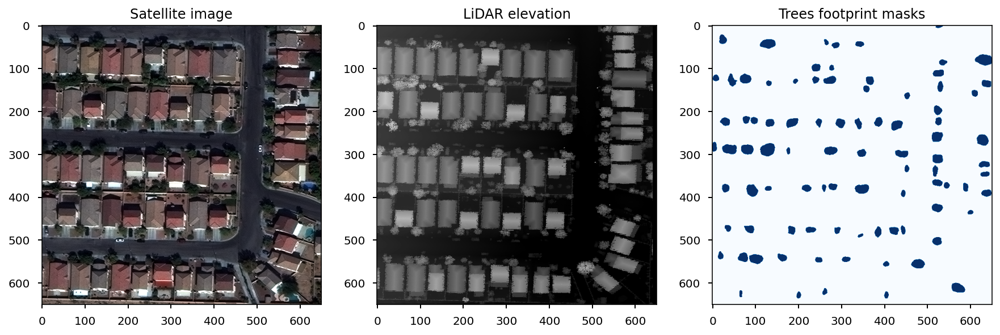

In [7]:
# Sample of an input data with the masks for the trees

sample = 'img1105' # chip ID

# Read in 4-channel image from GeoTIFF.
img_file = prefix + 'RGB+ELEV_' + sample + '.tif'
img_path = os.path.join(img_dir, img_file)
img = skimage.io.imread(img_path)
rgb = img[..., :3]
elev = img[..., -1]

# Read the mask file corresponding to the image
mask_file = prefix + 'mask_trees_' + sample + '.tif'
mask_path = os.path.join(mask_dir, mask_file)
mask = skimage.io.imread(mask_path)

# Display satellite image and trees footprint mask.
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(rgb)
ax[0].set_title('Satellite image')
ax[1].imshow(elev, cmap='gray', vmin=0, vmax=5000)
ax[1].set_title('LiDAR elevation')
ax[2].imshow(mask, cmap='Blues')
ax[2].set_title('Trees footprint masks')
fig.show()

## Train network model

The bounding polygons for the trees are converted to binary mask images (as shown above). These masks will be the "ground truth labels" to train our segmentation network model.

### Split train and test data

We can split a part of the data, hold this part of data out as a simulated blind test. The filenames for each data group are saved to CSV file `split_train_data.csv` and `split_blind_test.csv`, respectively. We can split the image tiles by 30%/70%.

In [8]:
# Get lists of training image/label files.
img_file_list = [f for f in os.listdir(img_dir) if f.endswith('.tif')]
mask_file_list = [f for f in os.listdir(mask_dir) if f.endswith('.tif')]
# Extract the mask files that have corresponding RGB+LIDAR images.
mask_file_subset = [f for f in mask_file_list
    if f.replace('mask_trees_', 'RGB+ELEV_') in img_file_list]
img_path_list = [os.path.join(img_dir, f) for f in img_file_list]
mask_path_list = [os.path.join(mask_dir, f) for f in mask_file_subset]
assert len(img_path_list) == len(mask_path_list)
# Sort the list by filenames.
img_path_list.sort()
mask_path_list.sort()

# Create Pandas data frame, containing columns 'image' and 'label'.
total_df = pd.DataFrame({'image': img_path_list,
                         'label': mask_path_list})
# Split this data frame to training data and blind test data.
split_mask = np.random.rand(len(total_df)) < 0.7
train_df = total_df[split_mask]
test_df = total_df[~split_mask]

# Save the data frames to CSV files.
train_csv_path = './data/trees/split_train_data.csv'
test_csv_path = './data/trees/split_blind_test.csv'
train_df.to_csv(train_csv_path)
test_df.to_csv(test_csv_path)

# For reproducibility you can load the saved paths later.
# train_df = pd.read_csv(train_csv_path)
# test_df = pd.read_csv(test_csv_path)
print('{} images in total, {} - train, {} - test.'.format(
    len(total_df), len(train_df), len(test_df)))

76 images in total, 55 - train, 21 - test.


### Training setup

Now that train/test data are ready to go, we will set up the network model training. The library `solaris` helps building a ML pipeline for overhead imagery, which handles data loading, pre-processing, augmentation, model training/inference, and performance evaluation.

For this notebook, the training setup in `.yml` format are saved in directory `configs/trees/`:
1. `RGB+ELEV.yml`: network uses both RGB and LiDAR elevation as merged input (4-channel).

In the following cell, please select the config file you would like to experiment.

In [9]:
# --------------------------------------------#
# Select the config file you want to use
config = sol.utils.config.parse('./configs/trees/RGB+ELEV.yml')
# --------------------------------------------#

# Link training datasets to config.
config['training_data_csv'] = train_csv_path
config['inference_data_csv'] = test_csv_path

A side note: since we do not explicitly assign `validation_data_csv` in the config, `solaris` will automatically split a random portion (specified by `val_holdout_frac`, in this case 0.05) of training data for validation during training.

Next, let's load a customized VGG16-Unet from `networks/` directory. This algorithm is from the winner `XD_XD` from SpaceNet challenge 4 ([link to repo](https://github.com/SpaceNetChallenge/SpaceNet_Off_Nadir_Solutions/tree/master/XD_XD)). We modified the code so that it takes multi-channel input.

In [19]:
!pygmentize './configs/trees/RGB+ELEV.yml'

model_name: xdxd_spacenet4

model_path:
train: true
infer: true

pretrained: false
nn_framework: torch
batch_size: 20 

data_specs:
    width: 512
    height: 512
    image_type: 16bit
    channels: 4
    label_type: mask
    is_categorical: false
    mask_channels: 1
    val_holdout_frac: 0.05
    dtype:

training_data_csv: 'csv_file_path'
validation_data_csv: 'auto_split_from_training_dataset'
inference_data_csv: 'csv_file_path'

training_augmentation:
    augmentations:
        HorizontalFlip:
            p: 0.5
        RandomRotate90:
            p: 0.5
        RandomCrop:
            height: 512
            width: 512
            p: 1.0
        Normalize:
            mean:
                - 0.0
                - 0.0
                - 0.0
                - 0.0
            std:
                - 1.0
                - 1.0
                - 1.0
                - 20.0
            max_pixel_value: 255
            p: 1.0
    p: 1.0
    shuffle: true
validation_augmentation:
    augmentat

In [10]:
# Load customized multi-channel input VGG16-Unet model.
from networks.vgg16_unet import get_modified_vgg16_unet

custom_model = get_modified_vgg16_unet(
    in_channels=config['data_specs']['channels'])
custom_model_dict = {
    'model_name': 'modified_vgg16_unet',
    'weight_path': None,
    'weight_url': None,
    'arch': custom_model
}

# Create trainer
trainer = sol.nets.train.Trainer(config, custom_model_dict=custom_model_dict)
# Show model architecture
# print(trainer.model)

We are all set for training!

Since training takes a long time, we also provide our trained model weights. You can execute the following code to have a pretrained model in `models/trees/` directory. The next inference section will use these trained weights. However, if your time and resource allows, uncomment and run the cell to train your own model.

In [11]:
# Distributing a pretrained network using Cloudfront distribution
!sudo wget -O ./models/trees/model.pth https://d2974anqgfynow.cloudfront.net/model.pth
!cp ./models/trees/model.pth ./models/trees/RGB+ELEV.pth

--2022-06-13 03:25:34--  https://d2974anqgfynow.cloudfront.net/model.pth
Resolving d2974anqgfynow.cloudfront.net (d2974anqgfynow.cloudfront.net)... 18.67.66.90, 18.67.66.199, 18.67.66.16, ...
Connecting to d2974anqgfynow.cloudfront.net (d2974anqgfynow.cloudfront.net)|18.67.66.90|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 117249871 (112M) [application/x-www-form-urlencoded]
Saving to: ‘./models/trees/model.pth’

./models/trees/mode 100%[===================>] 111.82M  73.7MB/s    in 1.5s    

2022-06-13 03:25:36 (73.7 MB/s) - ‘./models/trees/model.pth’ saved [117249871/117249871]



### [Optional]

In [ ]:
# --------------------------------------------#
# Training is skipped by default.
# Uncomment the following line if you want to repeat the trainig process.
# trainer.train()
# --------------------------------------------#

Beginning training epoch 0
    loss at batch 0: 9.400802612304688

    Validation loss at epoch 0: 9.382129669189453

Beginning training epoch 1
    loss at batch 0: 9.28113842010498

    Validation loss at epoch 1: 9.26561164855957

Beginning training epoch 2
    loss at batch 0: 9.193004608154297

    Validation loss at epoch 2: 9.10687255859375

Beginning training epoch 3
    loss at batch 0: 9.057920455932617

    Validation loss at epoch 3: 8.600027084350586

Beginning training epoch 4
    loss at batch 0: 8.582988739013672

    Validation loss at epoch 4: 4.493414878845215

Beginning training epoch 5
    loss at batch 0: 5.223962783813477

    Validation loss at epoch 5: 5.176238059997559

Beginning training epoch 6
    loss at batch 0: 5.54740571975708

    Validation loss at epoch 6: 5.246084213256836

Beginning training epoch 7
    loss at batch 0: 5.672933101654053

    Validation loss at epoch 7: 4.50303316116333

Beginning training epoch 8
    loss at batch 0: 5.50168895721

## Inference on sample data

After training, we can test the model by first trying on the sample data displayed earlier.

Note: if you are using a small instance such as ml.t2.medium, skip executing the next cell. 

In [47]:
custom_model_dict = {
    'model_name': 'modified_vgg16_unet',
    'weight_path': config['training']['model_dest_path'],
    'weight_url': None,
    'arch': custom_model}
config['train'] = False
inferer = sol.nets.infer.Inferer(config, custom_model_dict=custom_model_dict)

sample_df = pd.DataFrame({'image': [img_path]}) # previous sample image
# Comment/ Uncomment this line if you have a notebook instance such as ml.g4dn.xlarge
inferer(sample_df)

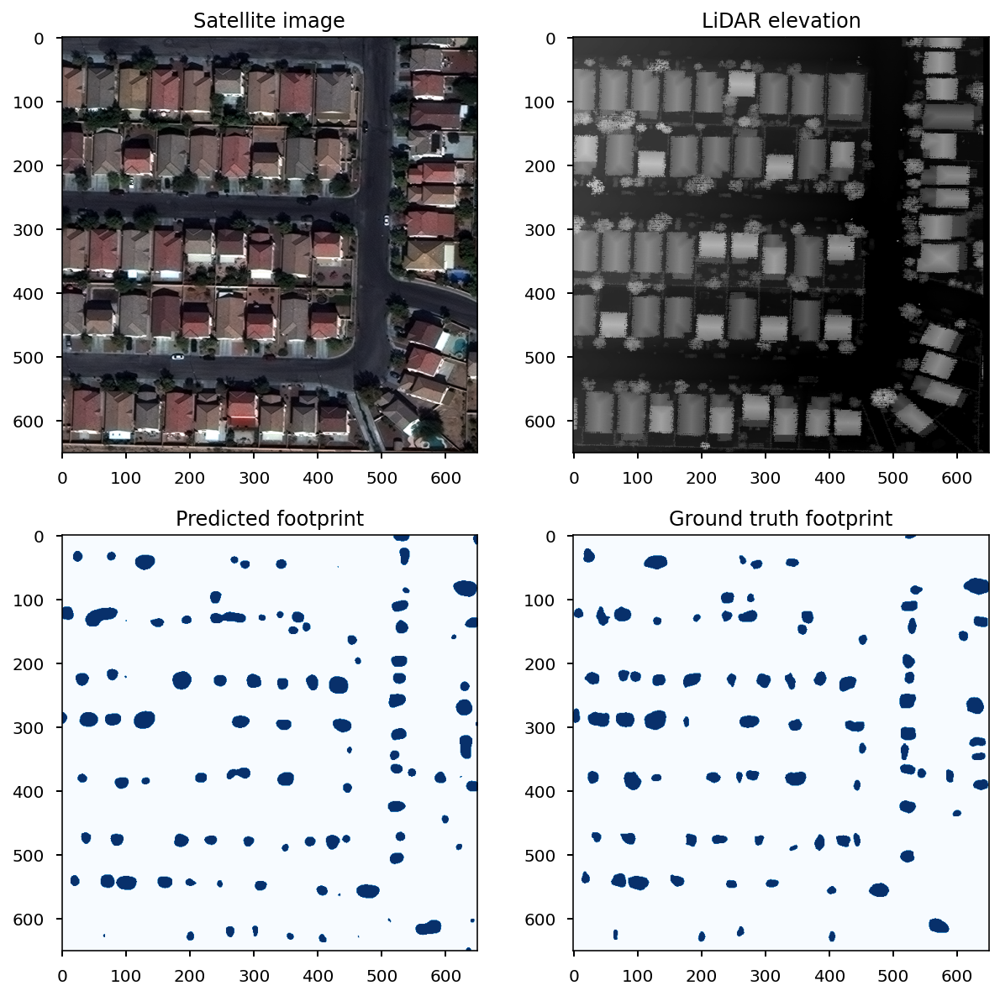

In [12]:
# Load prediction result from the output directory.
pred_dir = config['inference']['output_dir']
pred_file = prefix + 'RGB+ELEV_' + sample + '.tif'
pred_path = os.path.join(pred_dir, pred_file)
pred = skimage.io.imread(pred_path)[..., 0]

# Display satellite image, LiDAR, prediction mask, and ground truth mask.
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0][0].imshow(rgb)
ax[0][0].set_title('Satellite image')
ax[0][1].imshow(elev, cmap='gray', vmin=0, vmax=5000)
ax[0][1].set_title('LiDAR elevation')
ax[1][0].imshow(pred>0, cmap='Blues')
ax[1][0].set_title('Predicted footprint')
ax[1][1].imshow(mask, cmap='Blues')
ax[1][1].set_title('Ground truth footprint')
fig.show()

## Prediction accuracy on test data

We can check the prediction for the test data and calculate metrics such as Precision, Recall and F1 score. 

              precision    recall  f1-score   support

           0       0.98      0.98      0.98    396072
           1       0.73      0.75      0.74     26428

    accuracy                           0.97    422500
   macro avg       0.85      0.87      0.86    422500
weighted avg       0.97      0.97      0.97    422500



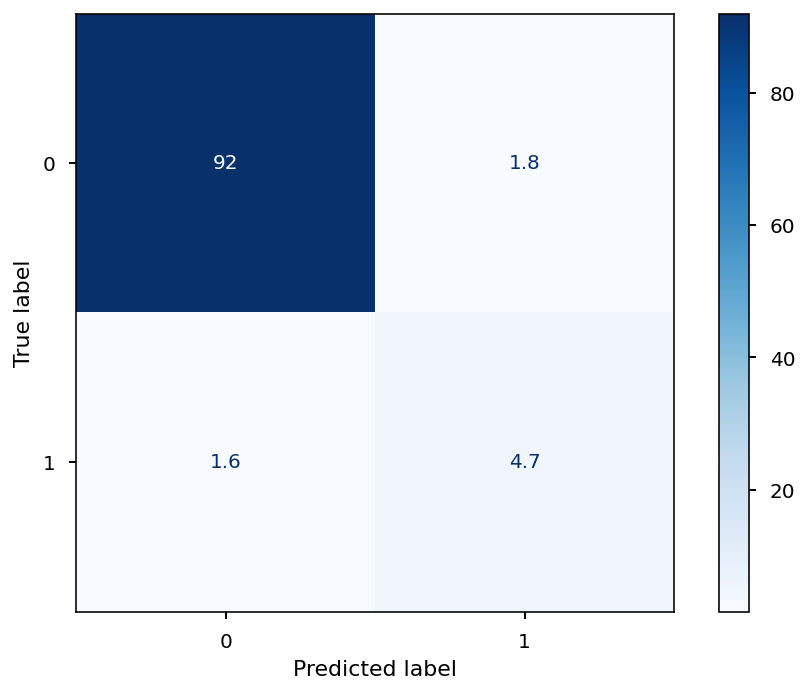

In [13]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

mask[mask >0] = 1 
print(classification_report(mask.flatten(), ((pred>0)*1).flatten()))

cm = confusion_matrix(mask.flatten(), ((pred>0)*1).flatten())
cmd = ConfusionMatrixDisplay(cm/np.sum(cm)*100, display_labels=['0','1'])
dummy_var = cmd.plot(cmap='Blues')

In [14]:
# Function to calculate the Intersection over Union of the prediction
def iou(outputs: np.array, labels: np.array):
    # This helps to bring numerical stability 
    SMOOTH = 1e-6
    
    intersection = (outputs & labels).sum()
    union = (outputs | labels).sum()
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)
    return iou 

In [15]:
print("Intersection over union (IoU) for the prediction is: ", f"{iou(((pred>0)*1), mask):.2}")

Intersection over union (IoU) for the prediction is:  0.59


## Risk identification 

In this section, we will identify the areas from the satellite images and LiDAR data that have trees approaching the power transmission lines and need predictive maintenance. If data is available, we can train a machine learning model to predict power transmission lines from the images. 

For simplicity, we assume that we already have information about the presence of power transmission lines in the images. The power transmission lines are straight lines defined by the two coordinates `(x1,y1)` and `(x2,y2)` relative to the coordinates of the satellite images and LiDAR data. 

We can specify the clearance area/ high risk area around the straight line by defining a clearance zone width. 

Based on the information of the power transmission lines and the trees identified using the machine learning model trained in the previous section, we will calculate the interesection of the trees with the clearance area. If the interection is non-zero, then this might be a high-risk area. Different thresholds can also be defined to identify the areas that need attention. The calculations can also be done on time-lapse data.

In [24]:
# Function to calculate the coordinates of the clearance area around the transmission line 
def clearance_area(x1,y1,x2,y2,width=10):
    """
    Inputs: Coordinates that define a line (x1,y1) and (x2,y2)
            Width = Width of the clearance area around the line
    Outputs: Four coordinates of the rectangle of the clearance area
    """
     
    dx = x2 - x1
    dy = y2 - y1
    linelength = np.sqrt(dx*dx + dy*dy)
    dx /= linelength
    dy /= linelength
    # (dx, dy) is now a unit vector pointing in the direction of the line
    # A perpendicular vector is given by (-dy, dx)
    px = 0.5 * width * (-dy) # perpendicular vector with lenght width * 0.5
    py = 0.5 * width * dx
    
    coord1 = (x1 + px, y1 + py)
    coord2 = (x2 + px, y2 + py)
    coord3 = (x2 - px, y2 - py)
    coord4 = (x1 - px, y1 - py)
    
    return [coord1, coord2, coord3, coord4]


In [16]:
# Function to calculate the slope of a line 
def slope(x1, y1, x2, y2):
    """
    Input: Coordinates that define a line (x1,y1) and (x2,y2)
    Output: Slope of the line in degrees
    """
    if x1 == x2:
        ans = 90
        return ans

    ans = math.atan2((y2-y1),(x2-x1))*180/math.pi
    return ans

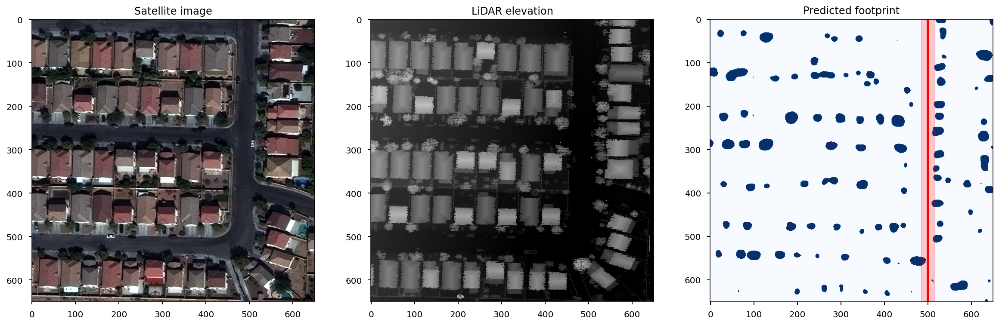

In [46]:
# Example where the transmission line given by the coordinates (500,0) and (500,650) and the width of the clearance area is 30 
line_x1, line_y1 = 500, 0
line_x2, line_y2 = 500, 650
width = 30
line_length = np.sqrt((line_x2 - line_x1)**2+(line_y2-line_y1)**2)
line_slope = slope(line_x1, line_y1, line_x2,line_y2)

# Load prediction result from the output directory.
pred_dir = config['inference']['output_dir']
pred_file = prefix + 'RGB+ELEV_' + sample + '.tif'
pred_path = os.path.join(pred_dir, pred_file)
pred = skimage.io.imread(pred_path)[..., 0]

# Display satellite image, LiDAR, prediction mask, and ground truth mask.
fig, ax = plt.subplots(1, 3, figsize=(20, 20))
ax[0].imshow(rgb)
ax[0].set_title('Satellite image')
ax[1].imshow(elev, cmap='gray', vmin=0, vmax=5000)
ax[1].set_title('LiDAR elevation')
ax[2].imshow(pred>0, cmap='Blues')
# Plot the transmission line based on the coordinates 
ax[2].plot([line_x1, line_x2], [line_y1, line_y2], color="red", linewidth=3)
# Plot the clearance area around the line
ax[2].add_patch(Rectangle((line_x1-width/2,line_y1),width,line_length,
                          angle=90-line_slope,
                          edgecolor='red',
                          facecolor='red',
                          alpha=0.2,
                          lw=1))
ax[2].set_title('Predicted footprint')
ax[2].autoscale(enable=True,tight=True)
fig.show()

In [44]:
# Calculating the intersection of the clearance area with the predicted footprint 

nx, ny = pred.shape[0], pred.shape[1]
poly_verts = clearance_area(line_x1,line_y1,line_x2,line_y2,width)

# Create vertex coordinates for each grid cell...
# (<0,0> is at the top left of the grid in this system)
x, y = np.meshgrid(np.arange(nx), np.arange(ny))
x, y = x.flatten(), y.flatten()

points = np.vstack((x,y)).T

path = Path(poly_verts)
grid = path.contains_points(points)
grid = grid.reshape((ny,nx))

intersect = (((pred>0)*1) & (grid*1)).sum()

print("Intersection between predicted footprint and transmission line clearance area is: ", intersect)

Intersection between predicted footprint and transmission line clearance area is:  396


## Deploy the model as an endpoint

In [48]:
import boto3
import sagemaker
from sagemaker.pytorch import PyTorchModel
from sagemaker import get_execution_role, Session

sess = Session()
role = get_execution_role()

In [49]:
# Generate tarball of the saved model in the ./models/trees folder
%cd ./models/trees
import tarfile
with tarfile.open('model.tar.gz', 'w:gz') as f:
    f.add('model.pth')
f.close()
%cd ../..

/home/ec2-user/SageMaker/vegetation-management-remars2022/remars2022-workshop/models/trees
/home/ec2-user/SageMaker/vegetation-management-remars2022/remars2022-workshop


In [50]:
# Upload the tarball to S3 bucket
pt_model_data = sess.upload_data(path="./models/trees/model.tar.gz", bucket=sess.default_bucket(), key_prefix="model/pytorch")

In [51]:
# Declare the pytorch model and load the weights
model = PyTorchModel(
    entry_point="inference.py",
    source_dir="code",
    role=role,
    model_data=pt_model_data,
    framework_version="1.10",
    py_version="py38",
)

In [52]:
%%time
# Deploy the model as an endpoint 

from sagemaker.serializers import JSONSerializer
from sagemaker.deserializers import JSONDeserializer

instance_type = "ml.c5.4xlarge"

predictor = model.deploy(
    initial_instance_count=1,
    instance_type=instance_type,
    serializer=JSONSerializer(),
    deserializer=JSONDeserializer(),
)
print("Model deployed")

------!Model deployed
CPU times: user 9.39 s, sys: 1.03 s, total: 10.4 s
Wall time: 3min 12s


In [53]:
# Preprocessing the input data 
from libs.solaris.nets.datagen import InferenceTiler
from libs.solaris.nets import transform

def preprocess_fn(request_body):
    config_inf_aug = {'augmentations': {'Normalize': {'mean': [0.0, 0.0, 0.0, 0.0],
                                                      'std': [1.0, 1.0, 1.0, 20.0],
                                                      'max_pixel_value': 255,
                                                      'p': 1.0}},'p': 1.0}
    inf_tiler = InferenceTiler(
            'torch',
            width=512,
            height=512,
            x_step=None,
            y_step=None,
            augmentations=transform.process_aug_dict(
                config_inf_aug)
            )
    im_path = json.loads(request_body)["inputs"]
    inf_input, idx_refs, (src_im_height, src_im_width) = inf_tiler(im_path)
    return inf_input, idx_refs, (src_im_height, src_im_width)

In [54]:
# Preprocessing the data and saving the output into s3 bucket
dummy_data1 = {'inputs': './data/trees/RGB+ELEV/SN2_buildings_train_AOI_2_Vegas_RGB+ELEV_img1105.tif'}
dummy_data1_json = json.dumps(dummy_data1)
inf_input, idx_refs, (src_im_height, src_im_width) = preprocess_fn(dummy_data1_json)

# Upload the output to S3 bucket 
s3_client = boto3.client('s3')
my_array_data = io.BytesIO()
pickle.dump([inf_input, idx_refs, (src_im_height, src_im_width)], my_array_data)
my_array_data.seek(0)
s3_client.upload_fileobj(my_array_data, sess.default_bucket(), 'data/your-file.pkl')


In [55]:
# Using the endpoint for prediction on the preprocessed data
dummy_data = {"inputs": 's3://'+sess.default_bucket()+'/data/your-file.pkl'}
res = predictor.predict(dummy_data)

# The output goes into the following location in s3 bucket 
print(res)

s3://sagemaker-us-east-1-037978457745/data/output_pred.pkl


In [56]:
# Postprocessing the output from the model's predictions 
from libs.solaris.raster import image
def output_fn(subarr_preds, output_file_name):
    stitching_method = 'average'
    stitched_result = image.stitch_images(subarr_preds,
                                    idx_refs=idx_refs,
                                    out_width=src_im_width,
                                    out_height=src_im_height,
                                    method=stitching_method)
    skimage.io.imsave(output_file_name,stitched_result, check_contrast=False)
    s3_client.upload_file(output_file_name, sess.default_bucket(), 'data/test.tif')
    print("Uploaded result to "+ sess.default_bucket() + "/data/test.tif")
    return 

In [57]:
# Download the data from s3 bucket
my_array_data2 = io.BytesIO()
s3_client.download_fileobj(sess.default_bucket(), 'data/output_pred.pkl', my_array_data2)
my_array_data2.seek(0)
my_array2,idx_refs, src_im_height, src_im_width = pickle.load(my_array_data2)

# Postprocess the predictions and output image 
output_file_name = './results/test.tif' 
output_fn(my_array2,idx_refs, src_im_height, src_im_width, output_file_name)

Uploaded result to sagemaker-us-east-1-037978457745/data/test.tif


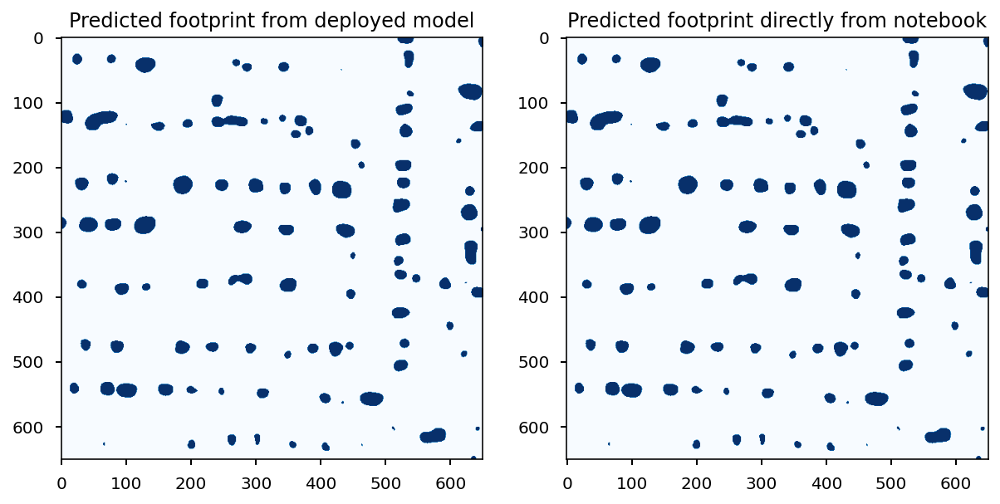

In [60]:
# Checking the output
test_pred = skimage.io.imread(output_file_name)

fig, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(test_pred>0, cmap='Blues')
ax[0].set_title('Predicted footprint from deployed model')
ax[1].imshow(pred>0, cmap='Blues')
ax[1].set_title('Predicted footprint directly from notebook')

fig.show()

In [ ]:
# Delete the endpoint configuration 
predictor.delete_endpoint()